In [1]:
import torch
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Paths
train_path = "train"
test_path = "test"

# Transformation for pretrained model
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  
        std=[0.229, 0.224, 0.225]    
    )
])
train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

model = models.resnet50(pretrained=True)
feature_extractor = torch.nn.Sequential(*(list(model.children())[:-1]))
feature_extractor.eval()

device =  "cpu"
feature_extractor = feature_extractor.to(device)

def extract_features(dataloader):
    features = []
    labels = []
    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            outputs = feature_extractor(inputs)
            outputs = outputs.view(outputs.size(0), -1) 
            features.append(outputs.cpu().numpy())
            labels.append(targets.cpu().numpy())
    return np.vstack(features), np.hstack(labels)
X_train, y_train = extract_features(train_loader)
X_test, y_test = extract_features(test_loader)

clf = LogisticRegression(max_iter=1000, class_weight='balanced')
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=test_dataset.classes))

/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


                    precision    recall  f1-score   support

collapsed_building       0.94      0.90      0.92       103
              fire       0.98      0.94      0.96       105
     flooded_areas       0.94      0.93      0.94       106
            normal       0.97      0.98      0.97       878
  traffic_incident       0.87      0.87      0.87        97

          accuracy                           0.96      1289
         macro avg       0.94      0.92      0.93      1289
      weighted avg       0.96      0.96      0.96      1289



/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [2]:
import torch.nn.functional as F

resnet_with_grad = models.resnet50(pretrained=True).eval().to(device)

def get_saliency_map(img_tensor, class_idx):
    img_tensor.requires_grad_()
    resnet_with_grad.zero_grad()
    output = resnet_with_grad(img_tensor)
    score = output[0, class_idx]
    score.backward()
    saliency, _ = torch.max(img_tensor.grad.data.abs(), dim=1)
    return saliency.squeeze().cpu().numpy()

/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
from torchvision.datasets import ImageFolder
import os
class ImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super().__getitem__(index)
        path = self.imgs[index][0]
        return original_tuple + (path,)  

from collections import defaultdict

test_dataset = ImageFolderWithPaths(test_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

from collections import defaultdict

required_classes = [
    'collapsed_building',
    'fire',
    'flooded_areas',
    'normal',
    'traffic_incident'
]

# Track correct and incorrect examples
correct_by_class = defaultdict(list)
incorrect_by_class = defaultdict(list)

def all_classes_filled(d):
    return all(len(d[class_name]) >= 3 for class_name in required_classes)

with torch.no_grad():
    for img, label, path in test_loader:
        img = img.to(device)
        features = feature_extractor(img)
        features = features.view(features.size(0), -1).cpu().numpy()

        pred = clf.predict(features)[0]

        class_name = test_dataset.classes[label.item()]
        sample = (path[0], label.item(), pred)

        if class_name in required_classes:
            if pred == label.item() and len(correct_by_class[class_name]) < 3:
                correct_by_class[class_name].append(sample)
            elif pred != label.item() and len(incorrect_by_class[class_name]) < 3:
                incorrect_by_class[class_name].append(sample)

        if all_classes_filled(correct_by_class) and all_classes_filled(incorrect_by_class):
            break
import matplotlib.pyplot as plt
from PIL import Image

def plot_with_saliency(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)

    sal_map = get_saliency_map(img_tensor.clone(), pred_label)

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].imshow(img)
    ax[0].set_title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    ax[0].axis('off')

    ax[1].imshow(sal_map, cmap='hot')
    ax[1].set_title("Saliency Map")
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()


 Correctly classified: collapsed_building


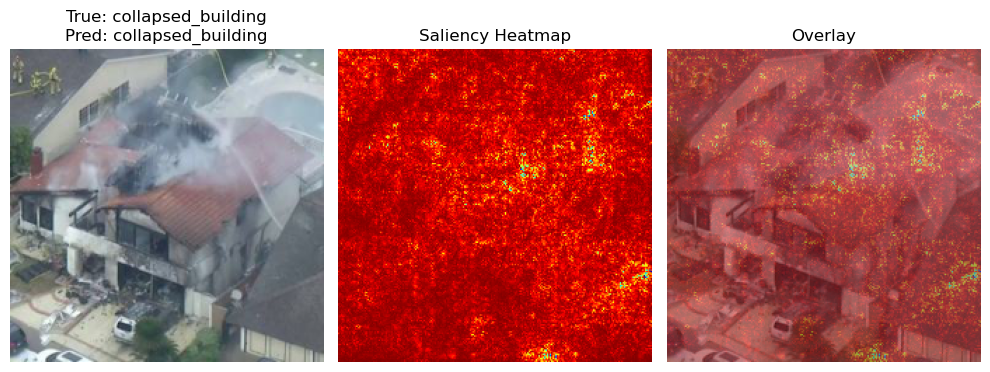

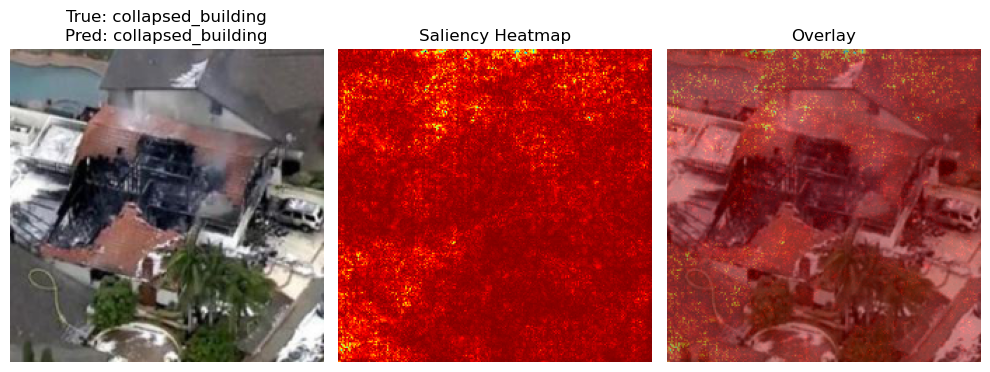

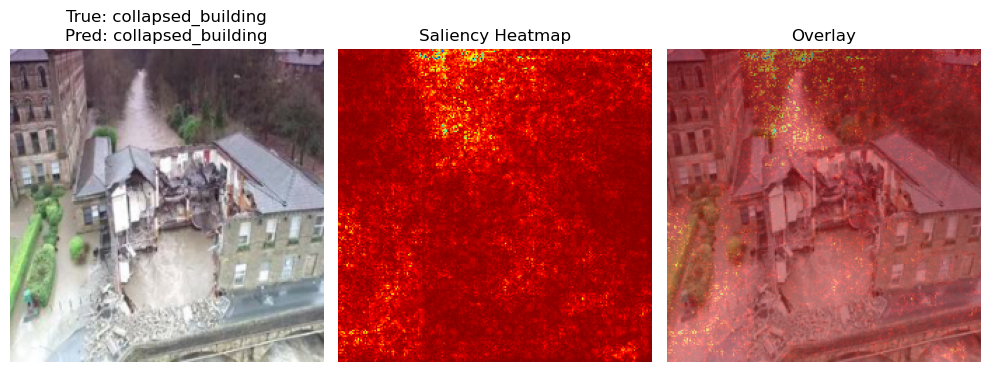


 not Correctly classified: collapsed_building


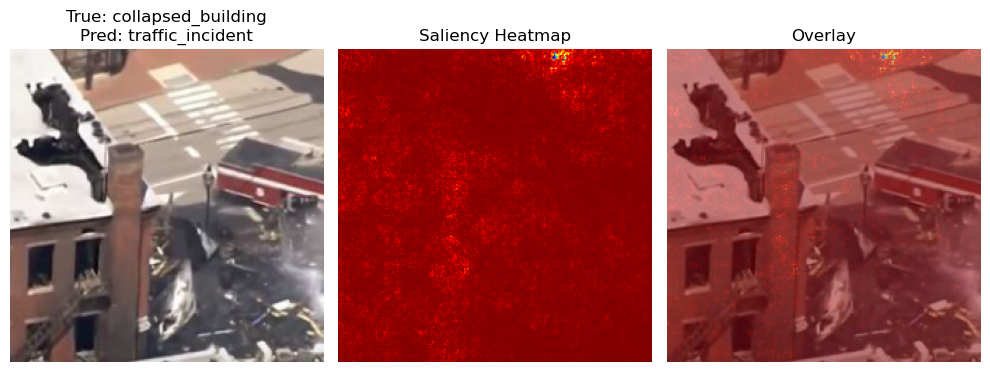

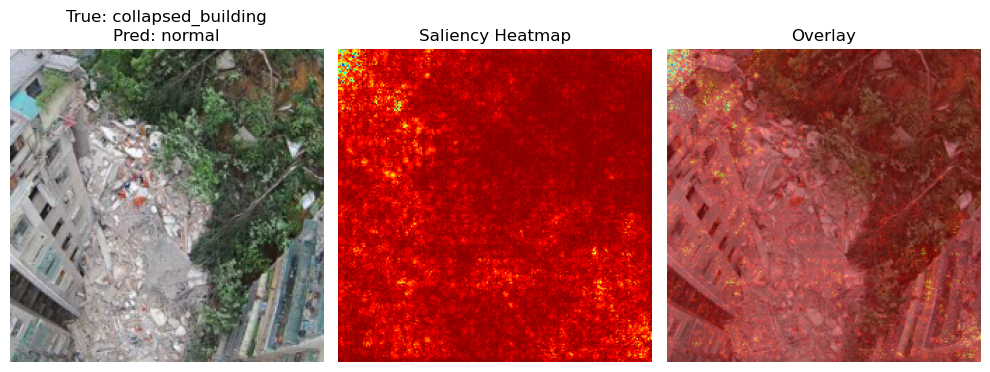

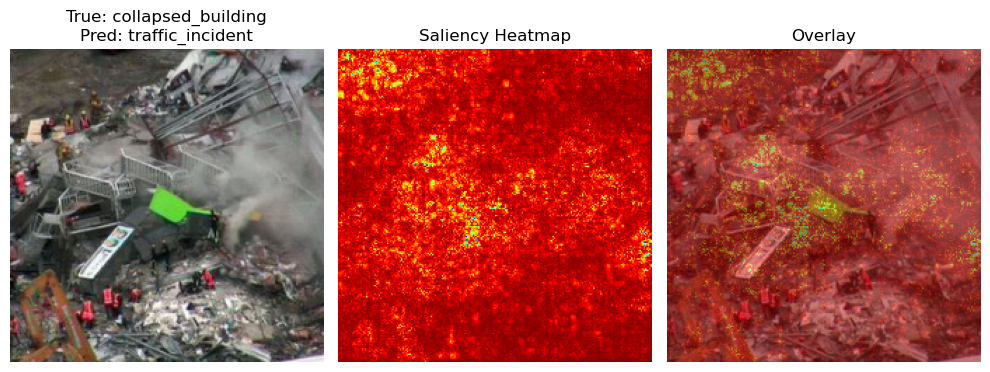


 Correctly classified: fire


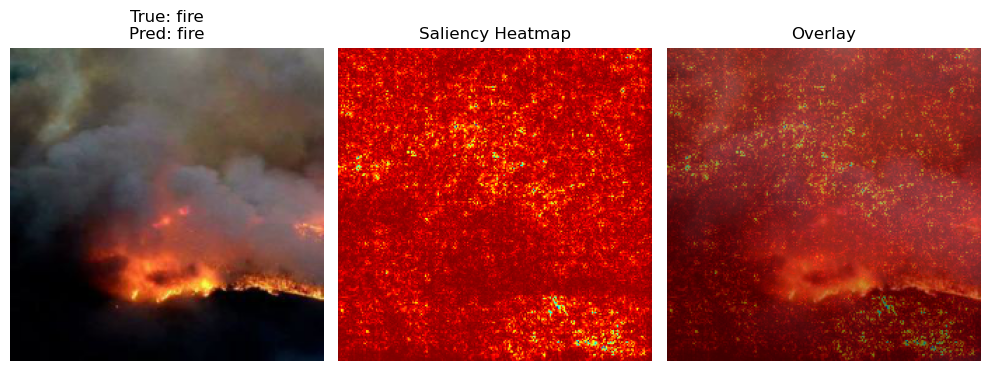

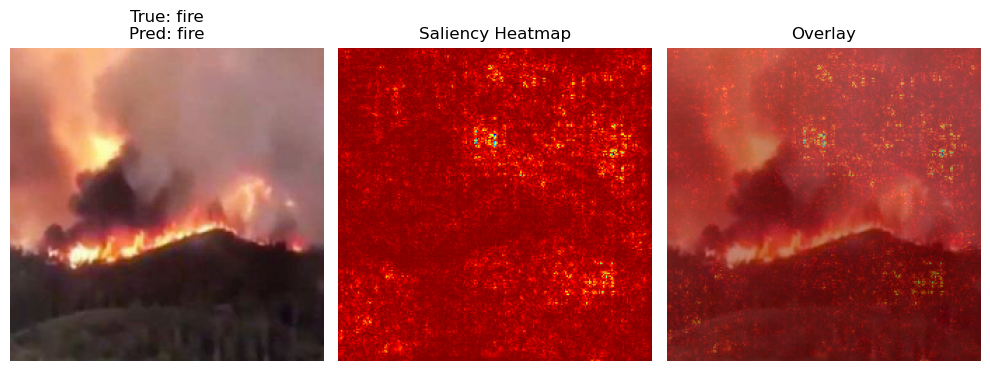

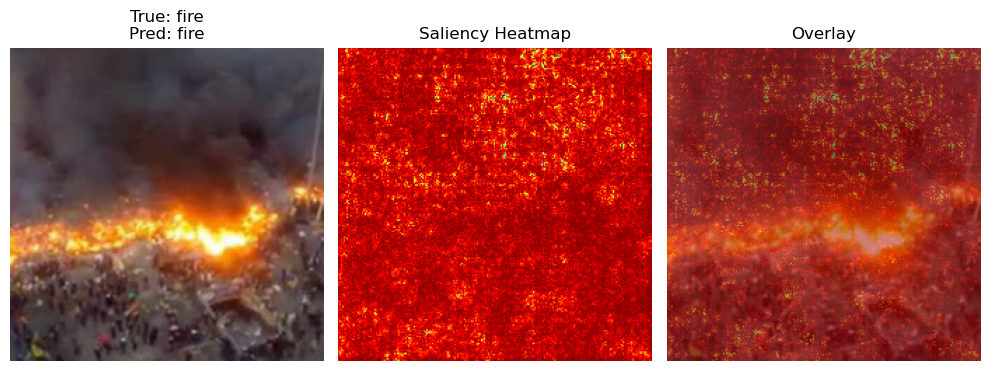


 not Correctly classified: fire


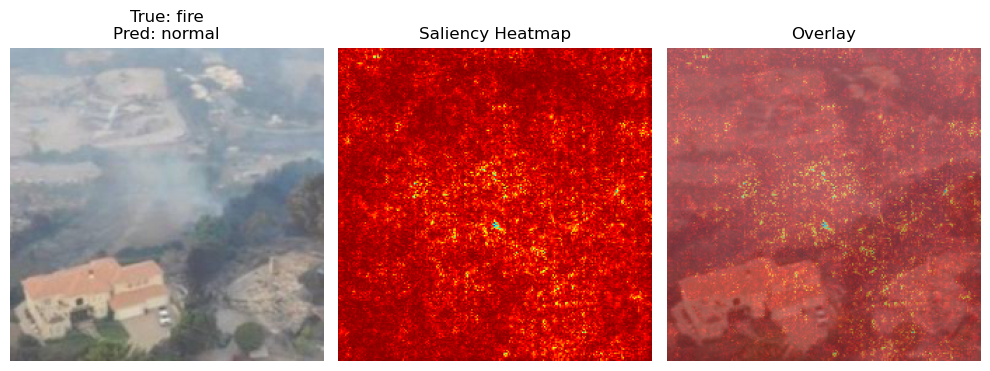

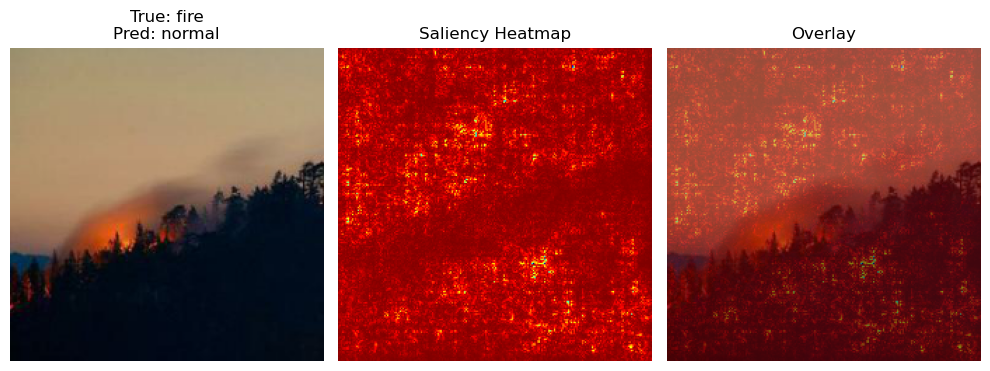

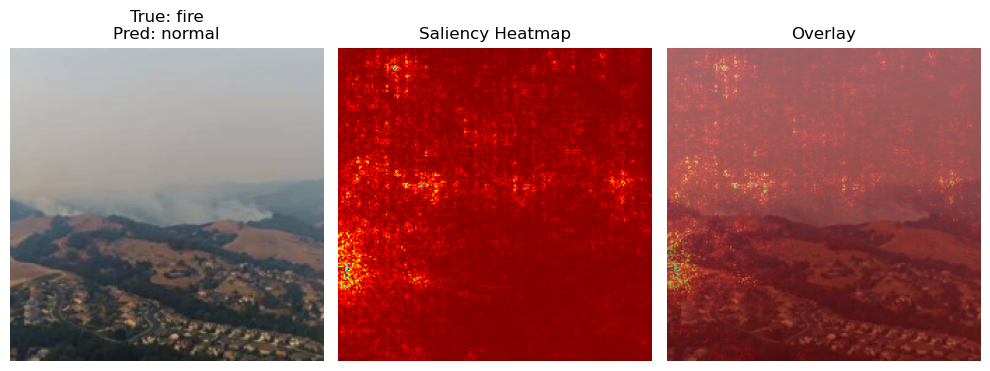


 Correctly classified: flooded_areas


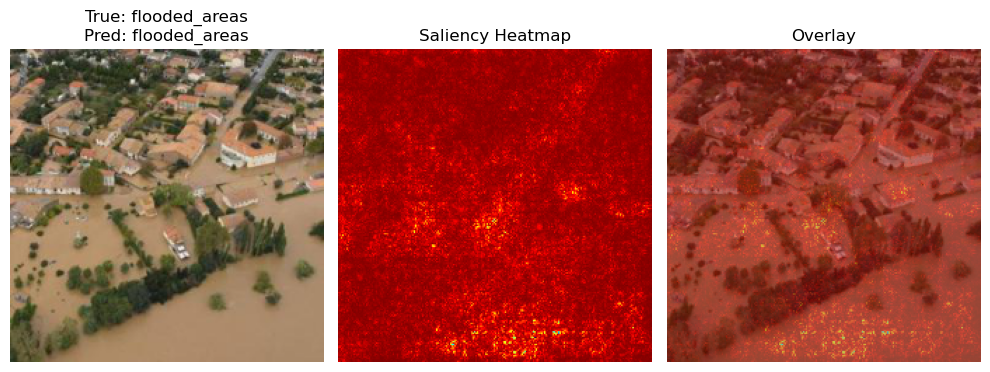

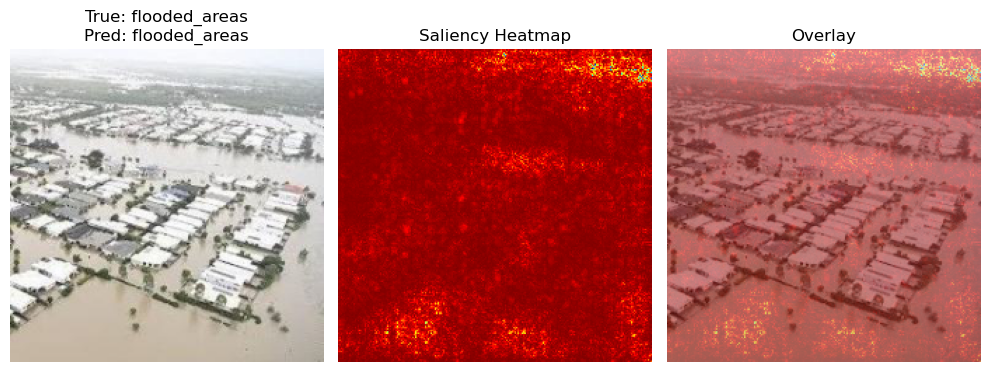

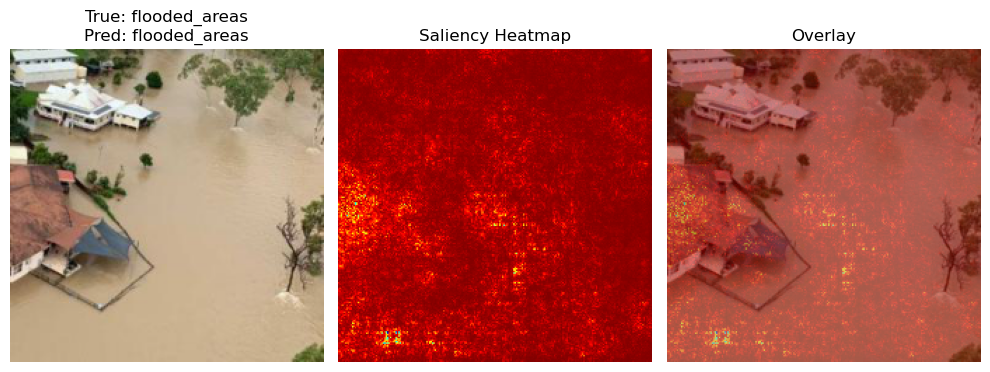


 not Correctly classified: flooded_areas


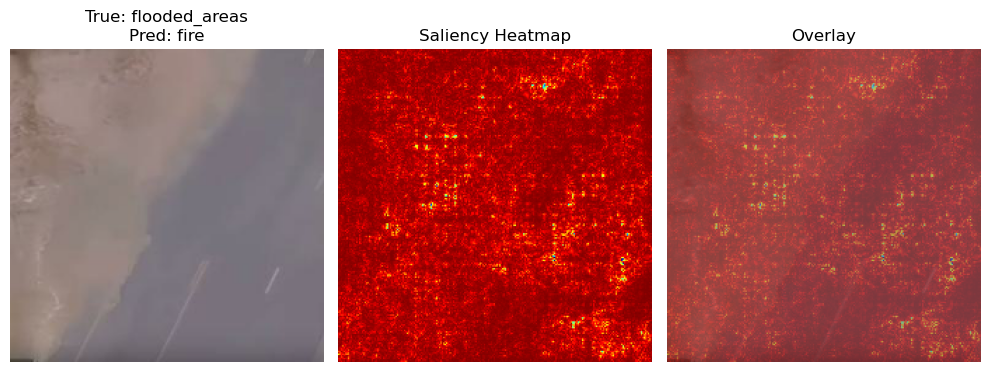

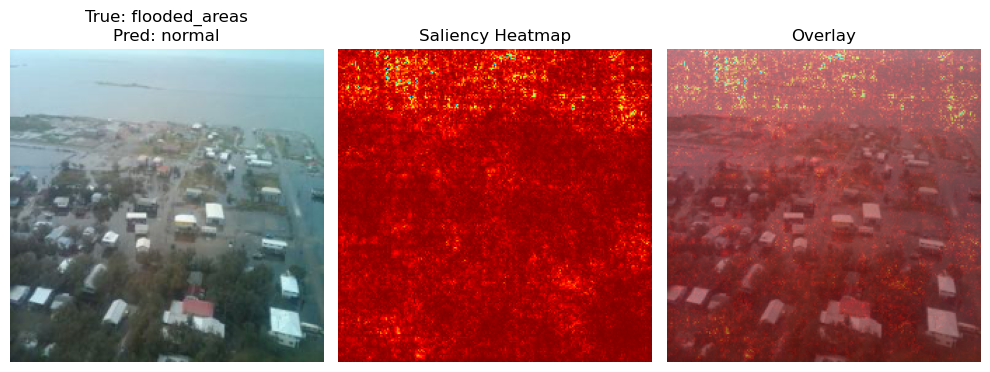

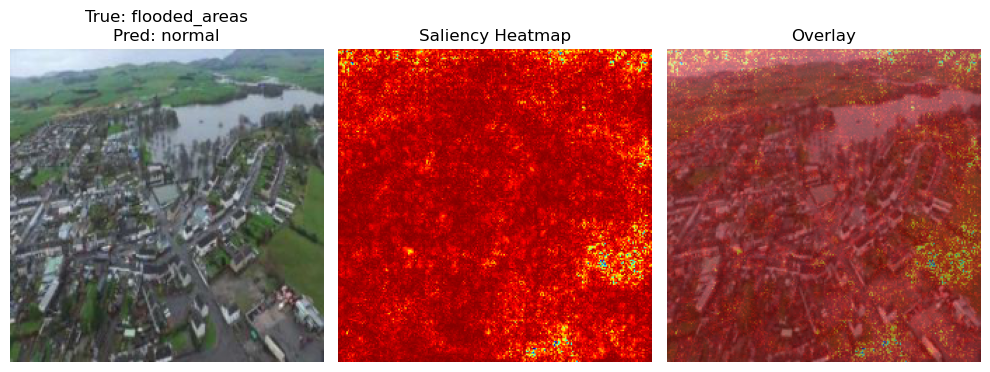


 Correctly classified: normal


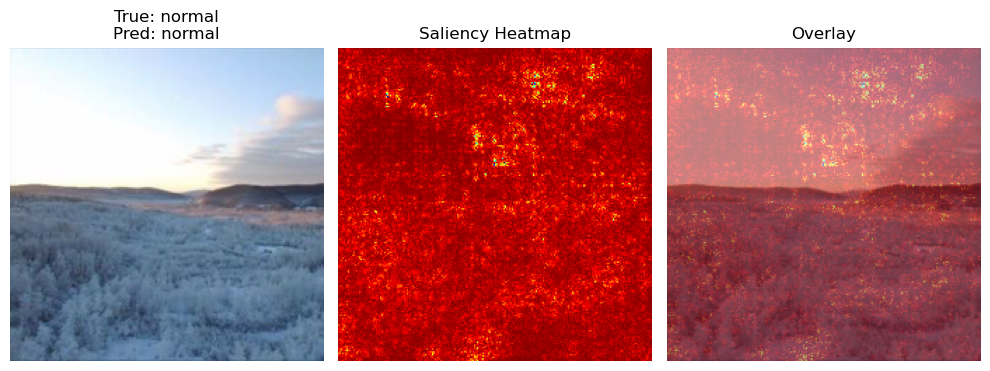

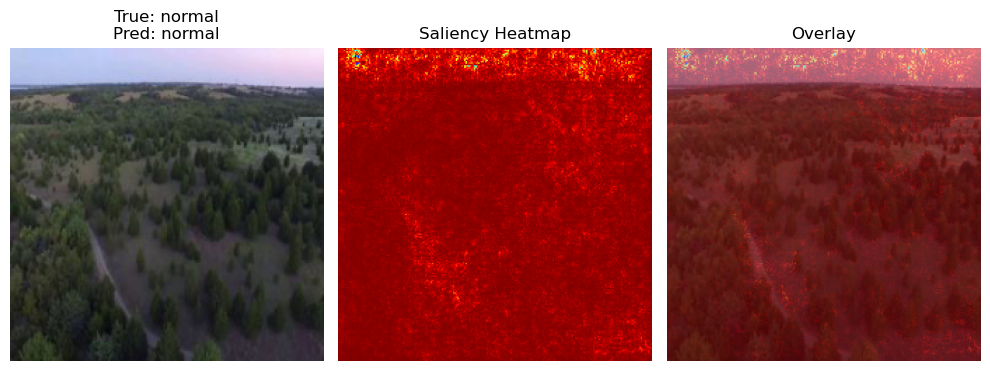

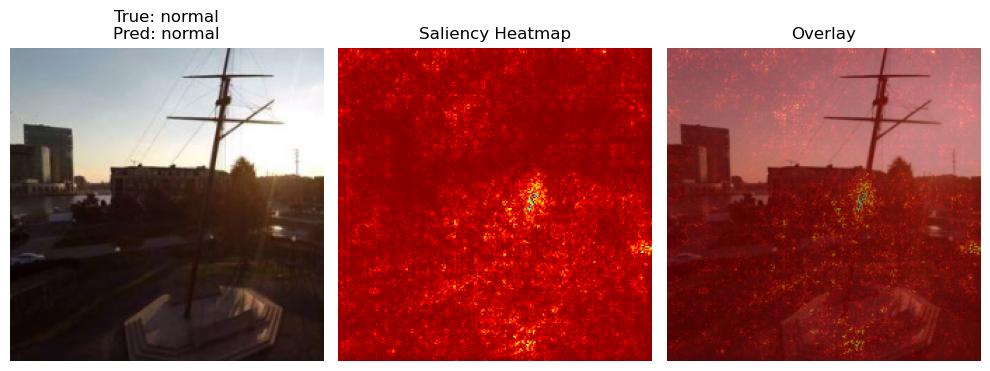


 not Correctly classified: normal


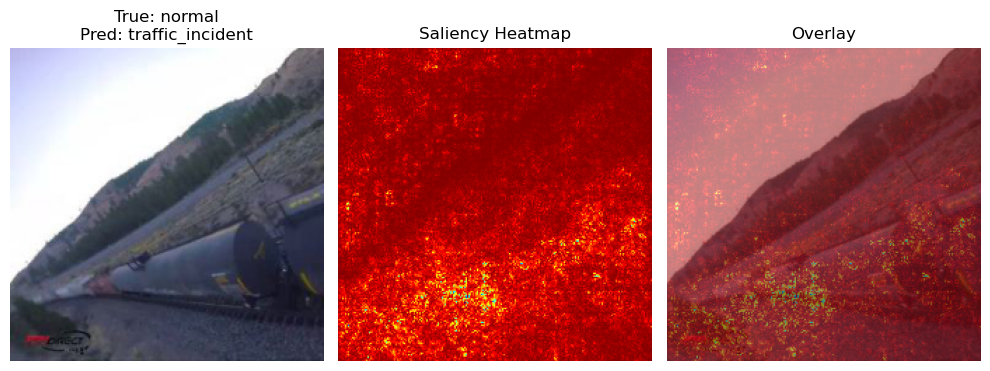

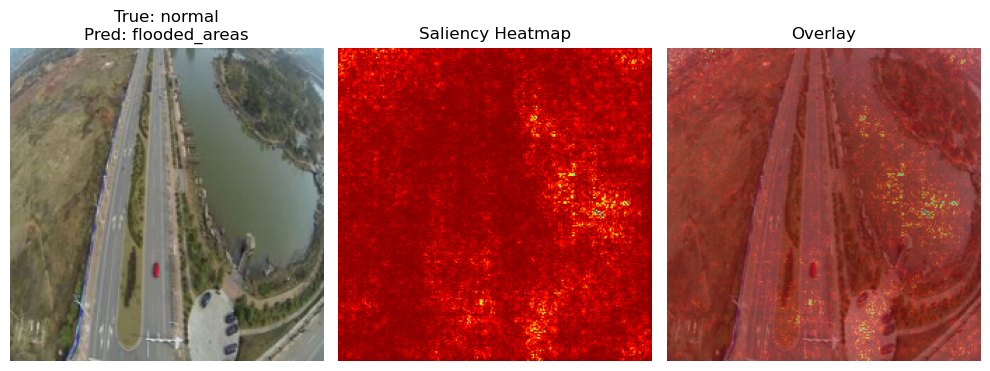

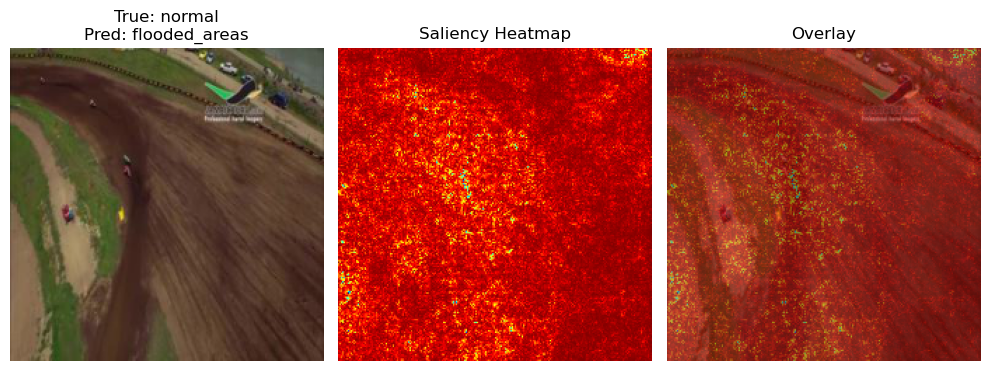


 Correctly classified: traffic_incident


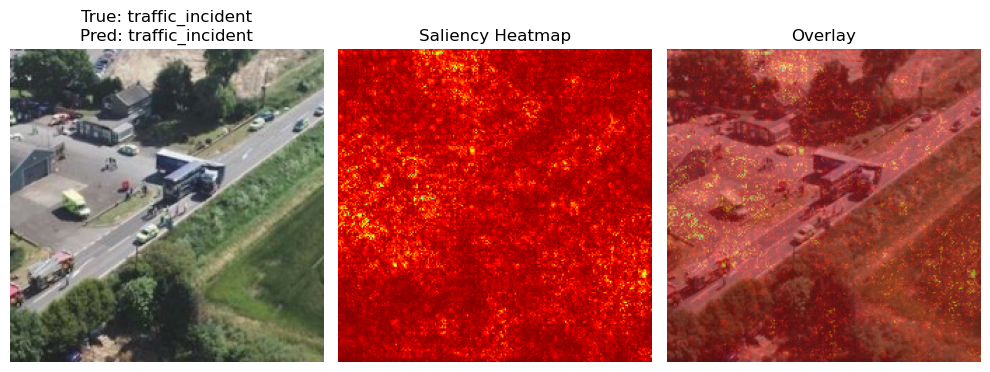

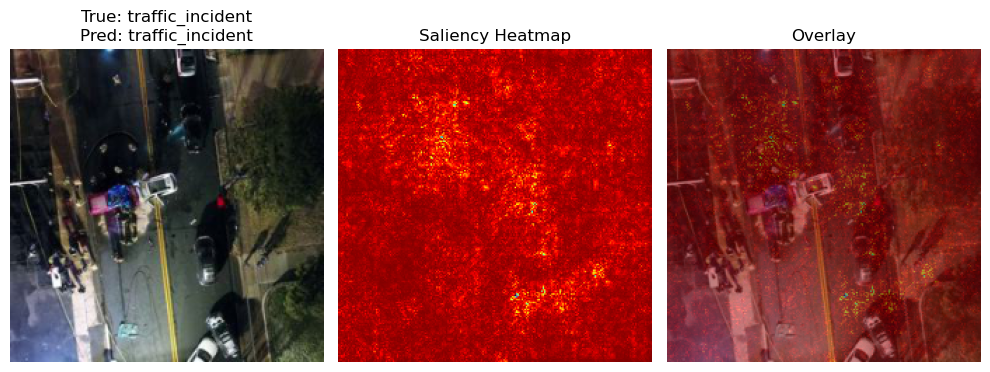

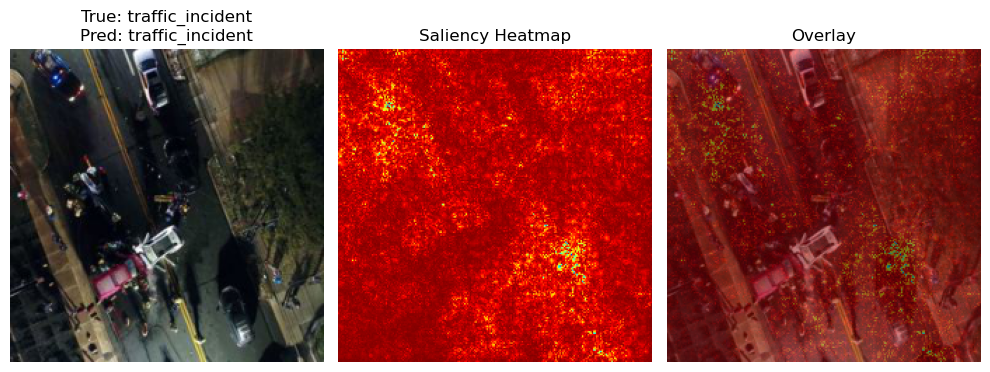


 not Correctly classified: traffic_incident


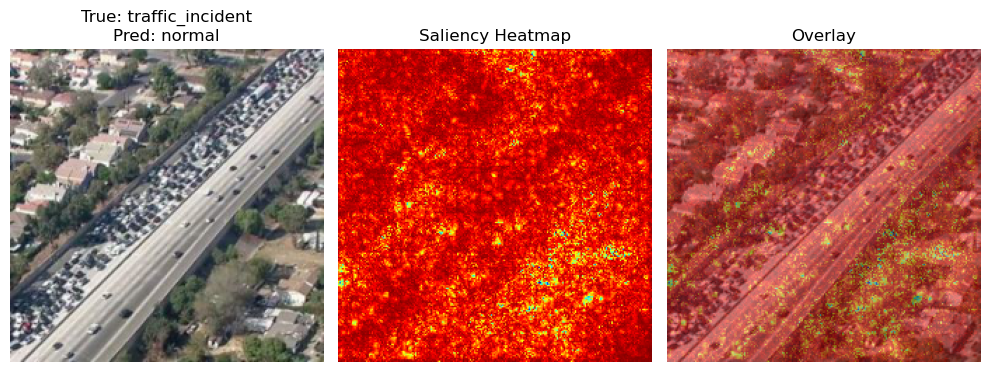

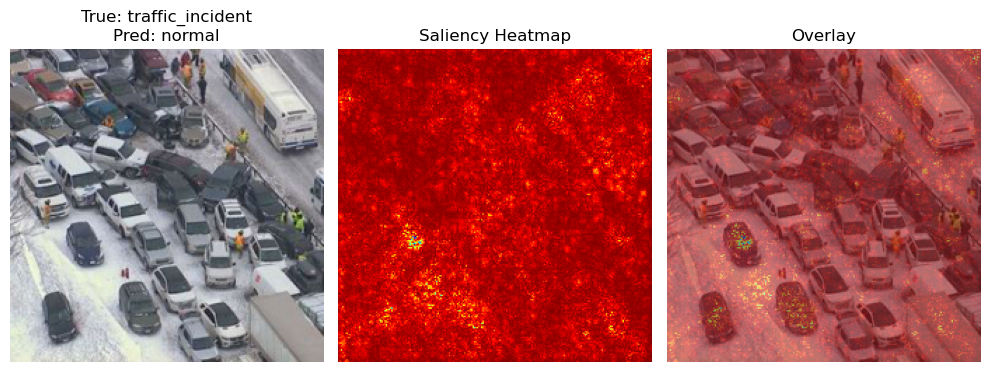

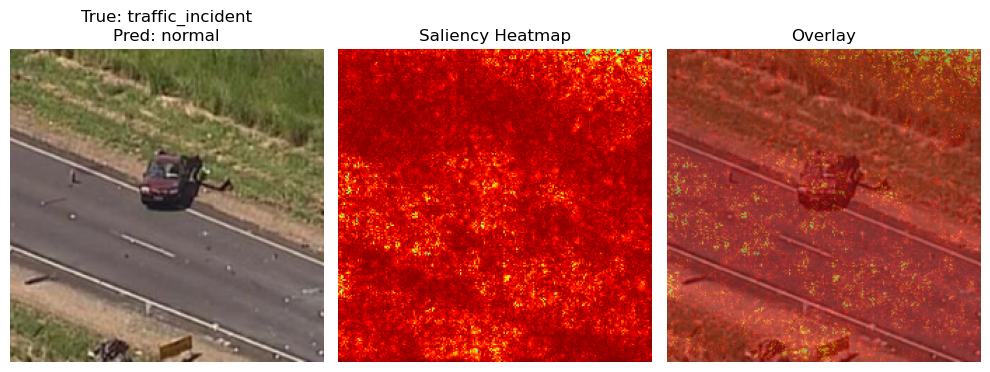

In [4]:
import cv2

def printImage(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)
    saliency_map = get_saliency_map(img_tensor.clone(), pred_label)
    saliency_map = (saliency_map - np.min(saliency_map)) / (np.max(saliency_map) - np.min(saliency_map))

    heatmap = cv2.applyColorMap(np.uint8(255 * saliency_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  

    original_img = np.array(img).astype(np.uint8)  
    original_img = cv2.resize(original_img, (heatmap.shape[1], heatmap.shape[0]))

    if original_img.max() <= 1.0:
        original_img = (original_img * 255).astype(np.uint8)

    if len(heatmap.shape) == 2:
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1)
    plt.title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    plt.imshow(original_img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Saliency Heatmap")
    plt.imshow(heatmap)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
for class_name in test_dataset.classes:
    print(f"\n Correctly classified: {class_name}")
    for sample in correct_by_class[class_name]:
        printImage(*sample)
    print(f"\n not Correctly classified: {class_name}")
    for sample in incorrect_by_class[class_name]:
        printImage(*sample)



For example 

In [5]:
import pandas as pd
import numpy as np

# Combine features and labels into a DataFrame
train_df = pd.DataFrame(X_train)
train_df['label'] = y_train

# Find duplicates
duplicates = train_df.duplicated()

# Print summary
print(f"Total training samples: {len(train_df)}")
print(f"Duplicate rows found: {duplicates.sum()}")

# Optional: show the duplicate rows
duplicate_rows = train_df[duplicates]
print("\nSample duplicate rows:")
print(duplicate_rows.head())


Total training samples: 15323
Duplicate rows found: 0

Sample duplicate rows:
Empty DataFrame
Columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]
Index: []

[0 rows x 2049 columns]


In [6]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Dictionary of models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced'),
    "Random Forest": RandomForestClassifier(n_estimators=100, class_weight='balanced'),
    "SVM": SVC(kernel='linear', probability=True, class_weight='balanced'),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
}

# Train and evaluate each model
for name, model in models.items():
    print(f"\n Training and evaluating: {name}")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f" Accuracy before outlier removal: {accuracy * 100:.2f}%")
    print(classification_report(y_test, y_pred, target_names=test_dataset.classes))



 Training and evaluating: Logistic Regression


/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


 Accuracy before outlier removal: 95.66%
                    precision    recall  f1-score   support

collapsed_building       0.94      0.90      0.92       103
              fire       0.98      0.94      0.96       105
     flooded_areas       0.94      0.93      0.94       106
            normal       0.97      0.98      0.97       878
  traffic_incident       0.87      0.87      0.87        97

          accuracy                           0.96      1289
         macro avg       0.94      0.92      0.93      1289
      weighted avg       0.96      0.96      0.96      1289


 Training and evaluating: Random Forest
 Accuracy before outlier removal: 92.94%
                    precision    recall  f1-score   support

collapsed_building       0.93      0.81      0.86       103
              fire       0.97      0.91      0.94       105
     flooded_areas       0.92      0.79      0.85       106
            normal       0.95      0.96      0.96       878
  traffic_incident       0.75    

/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:14:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


 Accuracy before outlier removal: 95.81%
                    precision    recall  f1-score   support

collapsed_building       0.92      0.89      0.91       103
              fire       0.97      0.94      0.96       105
     flooded_areas       0.97      0.92      0.94       106
            normal       0.97      0.97      0.97       878
  traffic_incident       0.86      0.96      0.91        97

          accuracy                           0.96      1289
         macro avg       0.94      0.94      0.94      1289
      weighted avg       0.96      0.96      0.96      1289



Total training samples: 15323
Outliers detected: 767
Inliers (non-outliers): 14556


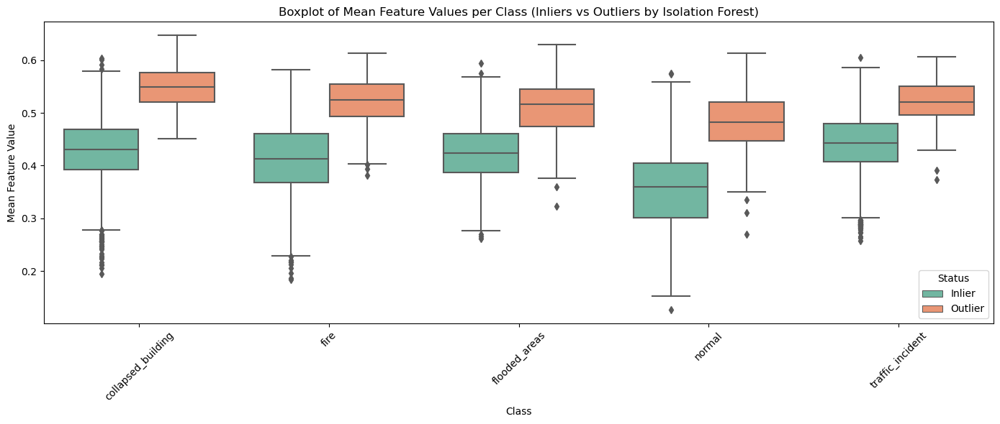

In [7]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
import numpy as np

# Step 1: Fit Isolation Forest on the training features
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outlier_pred = iso_forest.fit_predict(X_train)

# Step 2: Count and print summary
outliers = np.sum(outlier_pred == -1)
inliers = np.sum(outlier_pred == 1)
print(f"Total training samples: {len(X_train)}")
print(f"Outliers detected: {outliers}")
print(f"Inliers (non-outliers): {inliers}")

# Step 3: Prepare DataFrame with mean feature value, labels, and outlier info
feature_means = X_train.mean(axis=1)

df = pd.DataFrame({
    'mean_feature_value': feature_means,
    'label': y_train,
    'outlier': outlier_pred  # -1 = outlier, 1 = inlier
})

df['class_name'] = df['label'].apply(lambda x: train_dataset.classes[x])
df['outlier_status'] = df['outlier'].apply(lambda x: 'Outlier' if x == -1 else 'Inlier')

# Step 4: Plot boxplot with hue for outlier status
plt.figure(figsize=(14, 6))
sns.boxplot(x='class_name', y='mean_feature_value', hue='outlier_status', data=df, palette="Set2")
plt.title("Boxplot of Mean Feature Values per Class (Inliers vs Outliers by Isolation Forest)")
plt.xlabel("Class")
plt.ylabel("Mean Feature Value")
plt.xticks(rotation=45)
plt.legend(title='Status')
plt.tight_layout()
plt.show()


Original training samples: 15323
Removed outliers: 767
Remaining inliers: 14556


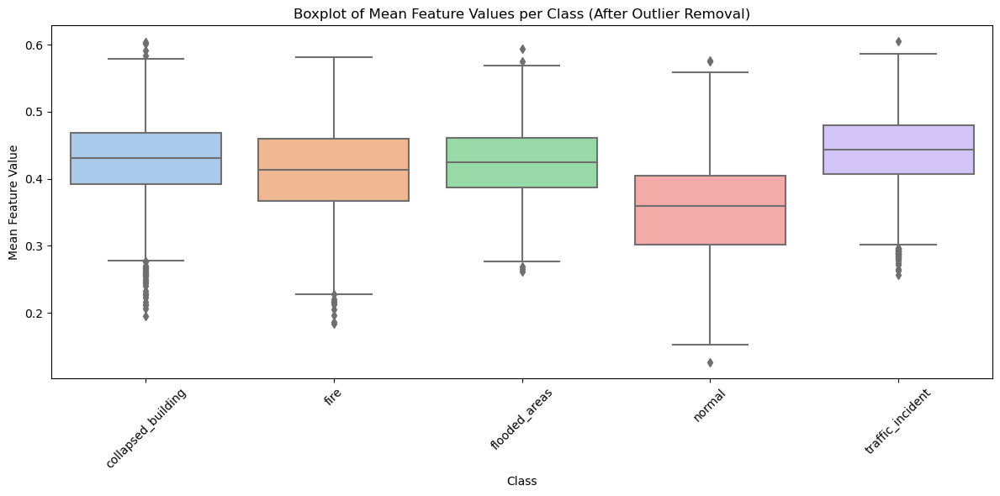

In [8]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
import numpy as np

# Step 1: Fit Isolation Forest on the training features
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outlier_pred = iso_forest.fit_predict(X_train)

# Step 2: Filter only inliers
inlier_mask = outlier_pred == 1
X_train_cleaned = X_train[inlier_mask]
y_train_cleaned = y_train[inlier_mask]

print(f"Original training samples: {len(X_train)}")
print(f"Removed outliers: {np.sum(~inlier_mask)}")
print(f"Remaining inliers: {len(X_train_cleaned)}")

# Step 3: Compute mean feature values
feature_means_cleaned = X_train_cleaned.mean(axis=1)

df_cleaned = pd.DataFrame({
    'mean_feature_value': feature_means_cleaned,
    'label': y_train_cleaned
})

df_cleaned['class_name'] = df_cleaned['label'].apply(lambda x: train_dataset.classes[x])

# Step 4: Plot boxplot (after removing outliers)
plt.figure(figsize=(12, 6))
sns.boxplot(x='class_name', y='mean_feature_value', data=df_cleaned, palette='pastel')
plt.title("Boxplot of Mean Feature Values per Class (After Outlier Removal)")
plt.xlabel("Class")
plt.ylabel("Mean Feature Value")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [9]:
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Step-1: Detect and remove outliers using Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outlier_pred = iso_forest.fit_predict(X_train)

# Keep only inliers
inlier_mask = outlier_pred == 1
X_train_cleaned = X_train[inlier_mask]
y_train_cleaned = y_train[inlier_mask]

print(f" Total training samples: {len(X_train)}")
print(f" Outliers removed: {np.sum(~inlier_mask)}")
print(f" Inliers retained: {len(X_train_cleaned)}")

# Step-2: Train and evaluate each model
for name, model in models.items():
    print(f"\n Training: {name}")
    model.fit(X_train_cleaned, y_train_cleaned)
    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    print(f" Accuracy after outlier removal: {acc:.4f}")
    print(f" Classification Report:\n{classification_report(y_test, y_pred, target_names=test_dataset.classes)}")


 Total training samples: 15323
 Outliers removed: 767
 Inliers retained: 14556

 Training: Logistic Regression


/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


 Accuracy after outlier removal: 0.9550
 Classification Report:
                    precision    recall  f1-score   support

collapsed_building       0.94      0.90      0.92       103
              fire       0.98      0.94      0.96       105
     flooded_areas       0.92      0.92      0.92       106
            normal       0.97      0.97      0.97       878
  traffic_incident       0.87      0.89      0.88        97

          accuracy                           0.96      1289
         macro avg       0.94      0.93      0.93      1289
      weighted avg       0.96      0.96      0.95      1289


 Training: Random Forest
 Accuracy after outlier removal: 0.9185
 Classification Report:
                    precision    recall  f1-score   support

collapsed_building       0.86      0.81      0.83       103
              fire       0.97      0.91      0.94       105
     flooded_areas       0.88      0.82      0.85       106
            normal       0.95      0.94      0.95       878
  

/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:19:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


 Accuracy after outlier removal: 0.9597
 Classification Report:
                    precision    recall  f1-score   support

collapsed_building       0.94      0.89      0.92       103
              fire       0.96      0.94      0.95       105
     flooded_areas       0.95      0.94      0.95       106
            normal       0.98      0.97      0.97       878
  traffic_incident       0.85      0.96      0.90        97

          accuracy                           0.96      1289
         macro avg       0.94      0.94      0.94      1289
      weighted avg       0.96      0.96      0.96      1289



/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:23:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/aneeshgundeti/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

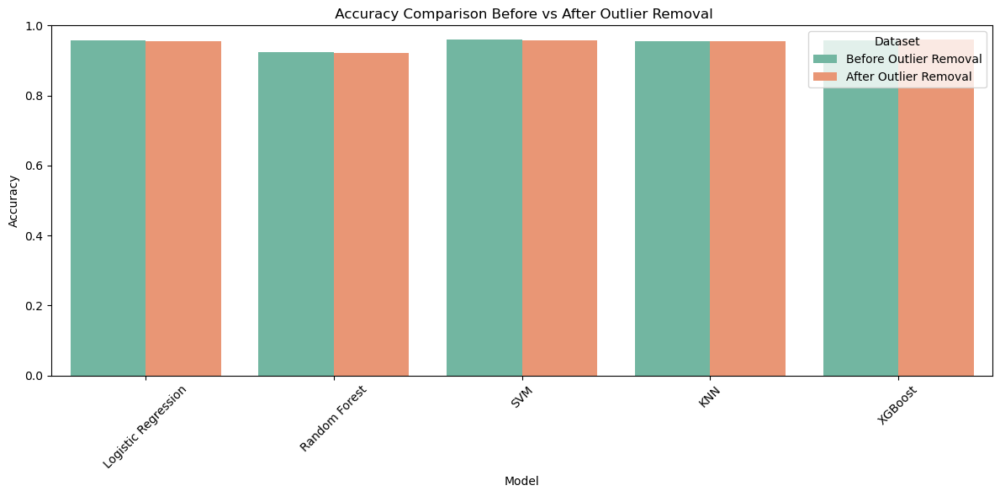

In [10]:
from sklearn.metrics import accuracy_score
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Store accuracies
results = {
    "Model": [],
    "Accuracy": [],
    "Dataset": []
}

# Accuracy BEFORE removing outliers
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)

    results["Model"].append(name)
    results["Accuracy"].append(acc)
    results["Dataset"].append("Before Outlier Removal")

# Accuracy AFTER removing outliers
for name, model in models.items():
    model.fit(X_train_cleaned, y_train_cleaned)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)

    results["Model"].append(name)
    results["Accuracy"].append(acc)
    results["Dataset"].append("After Outlier Removal")

# Convert to DataFrame
results_df = pd.DataFrame(results)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=results_df, x="Model", y="Accuracy", hue="Dataset", palette="Set2")
plt.title(" Accuracy Comparison Before vs After Outlier Removal")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
